In [1]:
"""環境"""
# .lab

"""更新履歴"""
# 最終更新日：2025/05/21
# 2025/05/21 shutilを使って、cachedirを洗浄することにしました
# 2025/05/15 simple_progress_barおよびdata(dict)を使い始めました。
# 2025/02/25 os.getcwd()を採用し、__file__を定義する必要をなくしました。

"""モジュール読み込み"""
# ファイル操作等
import sys
import os
# from datetime import datetime
from pprint import pprint
import logging
# import pickle
# import struct
from tqdm import tqdm
import h5py
# import threading
import json

# tkinter
from tkinter import filedialog, messagebox, Tk

# データ分析ツール
import pandas as pd
import numpy as np
import scipy as sp
# import math
# from sklearn.linear_model import LinearRegression

# グラフ等作成用
import matplotlib
import matplotlib.pyplot as plt         # 図の作成用
from PIL import Image as im
# import cv2
from IPython.display import display, HTML, clear_output, update_display, Image

# 自作モジュール
sys.path.append(r"C:\Users\okaza\pythonenv")
from modules.Mytools.Tools import print_fileinfo, h5_tree, dict_tree, simple_progress_bar, clean_cache_except_logfiles, get_total_size
import modules.Mytools.Settings
import modules.fitXRD as fx
from modules.peakfit import peakfit, pseudoVoigt

"""ログ管理ツール作成"""
# chche directoryの設定
cachedir = os.path.abspath(os.getcwd() + "/.cache")
clean_cache_except_logfiles(cachedir)
os.makedirs(cachedir, exist_ok=True)

# loggerの作成
logger = logging.getLogger(__name__)
logger.setLevel(logging.DEBUG)
format = "%(levelname)-9s  %(asctime)s [%(filename)s:%(lineno)d] %(message)s"

# Streamハンドラクラスを作成
sh = logging.StreamHandler()
sh.setLevel(logging.DEBUG)
sh.setFormatter(logging.Formatter(format))
logger.addHandler(sh)

# Fileハンドラクラスをインスタンス化
logfile = cachedir + ""
fh = logging.FileHandler(filename=cachedir + "/notebook.log", encoding="utf-8")
fh.setLevel(logging.DEBUG)
fh.setFormatter(logging.Formatter(format))
logger.addHandler(fh)
logger.debug("[Activate workspace]: " + os.getcwd())
logger.debug("[Set cache]: "+ os.path.abspath(cachedir))
logger.debug("[Activate log]: " + os.path.abspath(cachedir + "/notebook.log"))

# globalなデータを作成
data = dict()
logger.debug("[Create global variable]: data")

DEBUG      2025-07-15 09:04:14,547 [388102471.py:71] [Activate workspace]: c:\Users\okaza\pythonenv\fpd\fitting_csv
DEBUG      2025-07-15 09:04:14,548 [388102471.py:72] [Set cache]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache
DEBUG      2025-07-15 09:04:14,549 [388102471.py:73] [Activate log]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\notebook.log
DEBUG      2025-07-15 09:04:14,549 [388102471.py:77] [Create global variable]: data


## 目的

csvファイルを読み込んでフィッティングを行います。

## 1. ファイルの読み込み

まずファイルリストを作成します。

In [29]:
def set_filelist():

    # ディレクトリ名を指定
    dir = r"C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv"
    
    # ヘッダーとフッターを指定
    header = "UODE20_40_"
    footer = ".csv"

    if True: # Main

        # ヘッダーとフッターを含むファイル名を取得
        flist = list()
        for __ in os.listdir(dir):
            if not header in __:
                continue
            if not footer in __:
                continue
            flist.append(__)
        logger.debug("Read filenames")

        # ソート
        flist.sort(key = (lambda x: int(x.replace(header, "").replace(footer, ""))))
        logger.debug("Sort the file name list")

        # 表示
        flist = flist[:442]
        for f in flist:
            print(os.path.abspath(dir + "/" + f))

        # 格納
        key = sys._getframe().f_code.co_name
        data[key] = dict()
        data[key]["dir"] = dir
        data[key]["flist"] = flist
        data[key]["header"] = header
        data[key]["footer"] = footer
        logger.info("[Add variables]: " + key)
        dict_tree(data)

    return
set_filelist()
del set_filelist

DEBUG      2025-07-15 09:21:13,820 [2112332402.py:20] Read filenames


DEBUG      2025-07-15 09:21:13,821 [2112332402.py:24] Sort the file name list
INFO       2025-07-15 09:21:13,825 [2112332402.py:38] [Add variables]: set_filelist


C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv\UODE20_40_0.csv
C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv\UODE20_40_1.csv
C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv\UODE20_40_2.csv
C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv\UODE20_40_3.csv
C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv\UODE20_40_4.csv
C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv\UODE20_40_5.csv
C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv\UODE20_40_6.csv
C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv\UODE20_40_7.csv
C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv\UODE20_40_8.csv
C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv\UODE20_40_9.csv
C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv\UODE20_40_10.csv
C:\Users\okaza\Box\DataStrorage\SPring8-2025-07\mDIH20_0016\FPD_csv\UODE20_

データを読み込んで、hdfファイルに保存します。

In [25]:
import threading
import concurrent.futures as confu

In [30]:
def convertCSV2HDF():

    """更新履歴
    * 2025/06/25: データの取得方法を変更
    """

    # 変数読み込み
    dir = data["set_filelist"]["dir"]
    flist = data["set_filelist"]["flist"]
    n_frame = len(flist)

    # hdfファイル初期化
    key = sys._getframe().f_code.co_name
    hdffilename = cachedir + "/" + key + ".hdf"
    theta = pd.read_csv(dir + "/" + flist[0], header = None).values.T[0]
    with h5py.File(hdffilename, mode = "w") as f:
        f.create_dataset(
            name = "2theta",
            data = theta,
            shape = theta.shape,
            dtype = theta.dtype
        )
        g = f.create_group(
            name = "intensity"
        )
        for i in tqdm(range(n_frame)):
            g.create_dataset(
                name = "frame = {}".format(i),
                shape = theta.shape,
                dtype = theta.dtype
            )
    
    # lock
    lock = threading.Lock()

    # 演算
    with confu.ThreadPoolExecutor(max_workers=os.cpu_count()) as tpe:
        
        # 演算開始
        futures = [
            tpe.submit(
                lambda filename: (
                    int(os.path.splitext(filename)[0].replace(data["set_filelist"]["header"], "").replace(data["set_filelist"]["footer"], "")),
                    pd.read_csv(dir + "/" + filename, header = None).values.T[1]),
                filename
            ) for filename in flist
        ]

        # 終わったプロセスから順に出力
        for i, future in enumerate(confu.as_completed(futures)):
            intensity = future.result()
            with lock:
                j = intensity[0]
                with h5py.File(hdffilename, mode = "r+") as f:
                    f["intensity"]["frame = {}".format(j)][:] = intensity[1] # type: ignore
            simple_progress_bar(i+1, n_frame)

    # 表示
    data[key] = dict()
    data[key]["hdf"] = hdffilename
    logger.info("[Add variables]: " + key)
    with h5py.File(hdffilename, mode = "r") as f:
        h5_tree(f)
    

    return
convertCSV2HDF()
del convertCSV2HDF

100%|██████████| 442/442 [00:00<00:00, 55029.31it/s]


Progress: [■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■----]  91% (401/442) 

INFO       2025-07-15 09:21:20,562 [1221129909.py:61] [Add variables]: convertCSV2HDF


Progress: [■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■] 100% (442/442) 
<HDF5 file "convertCSV2HDF.hdf" (mode r)>
├── 2theta ((7200,), float64)
└── intensity
    ├── frame = 0 ((7200,), float64)
    ├── frame = 1 ((7200,), float64)
    ├── frame = 10 ((7200,), float64)
    ├── frame = 100 ((7200,), float64)
    ├── frame = 101 ((7200,), float64)
    ├── frame = 102 ((7200,), float64)
    ├── frame = 103 ((7200,), float64)
    ├── frame = 104 ((7200,), float64)
    ├── frame = 105 ((7200,), float64)
    ├── frame = 106 ((7200,), float64)
    ├── frame = 107 ((7200,), float64)
    ├── frame = 108 ((7200,), float64)
    ├── frame = 109 ((7200,), float64)
    ├── frame = 11 ((7200,), float64)
    ├── frame = 110 ((7200,), float64)
    ├── frame = 111 ((7200,), float64)
    ├── frame = 112 ((7200,), float64)
    ├── frame = 113 ((7200,), float64)
    ├── frame = 114 ((7200,), float64)
    ├── frame = 115 ((7200,), float64)
    ├── frame = 116 ((7200,), float64)
    ├── frame = 117 ((7200,), fl

## 2. 全データの可視化

1次元データを線画で表示します。

Progress: [■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■] 100% (442/442) 


DEBUG      2025-07-15 09:21:23,376 [123556372.py:74] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\plot_profile.png
DEBUG      2025-07-15 09:21:24,284 [123556372.py:77] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\plot_profile.pdf


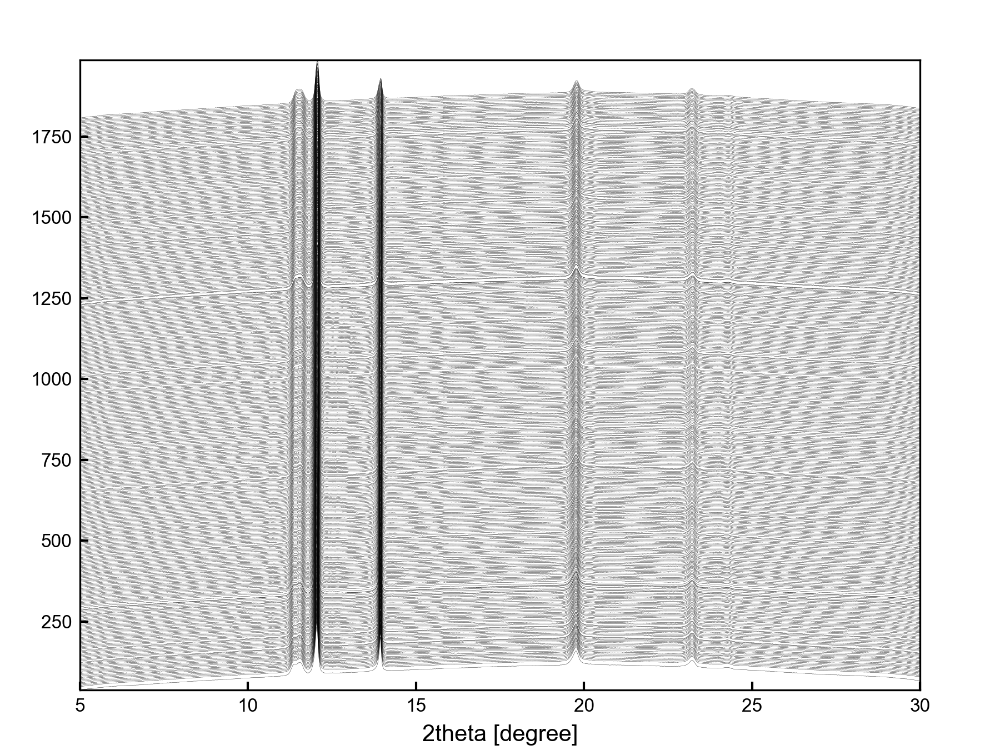

In [31]:
def plot_profile():

    # profileの間隔
    aset = 4

    # x軸の範囲
    theta_range = (5, 30)

    if True: # Main

        # flag処理
        if True:
            try:
                theta_range # type: ignore
            except:
                theta_range = None
                switch_theta_range = False
            else:
                switch_theta_range = True

        # figureを作成
        fig, ax = plt.subplots()
        fig.set_size_inches((6,4.5))
        fig.set_dpi(300)
        fig.subplots_adjust(
            left = 0.08,
            right = 0.92,
            bottom = 0.08,
            top = 0.92
        )

        # xデータを読み込み（共通）
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        if switch_theta_range:
            mask[theta<theta_range[0]] = False # type: ignore
            mask[theta>theta_range[1]] = False # type: ignore
        
        # axを構成
        ax.set_xlabel("2theta [degree]", fontsize = 10)
        ax.autoscale(tight = True)
        if switch_theta_range:
            ax.set_xlim(*theta_range) # type: ignore
        else:
            ax.set_xlim(theta[0], theta[-1])

        # すべてプロットする
        n_frame = len(data["set_filelist"]["flist"])
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensity = np.array(f["intensity"]["frame = {}".format(i)][()]) # type: ignore
                ax.plot(
                    theta[mask],
                    (intensity + i*aset)[mask],
                    lw = 0.1,
                    c = "0"
                )
                simple_progress_bar(i+1, n_frame)    

        # 画像の表示
        fig.canvas.draw()
        img = im.frombuffer(
            mode = "RGBA",
            size = fig.canvas.get_width_height(),
            data = fig.canvas.buffer_rgba(), # type: ignore
            decoder_name = "raw"
        )
        key = sys._getframe().f_code.co_name
        imgfilename = cachedir + "/{}.png".format(key)
        img.save(imgfilename)
        logger.debug("[Save fig]: " + os.path.abspath(imgfilename))        
        pdffilename = cachedir + "/{}.pdf".format(key)
        plt.savefig(pdffilename)
        logger.debug("[Save fig]: " + os.path.abspath(pdffilename))
        plt.close()
        display(Image(filename = imgfilename, width = 600))

    return
plot_profile()
del plot_profile

DEBUG      2025-07-15 09:21:30,345 [2421345399.py:92] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\imshow_profile.png


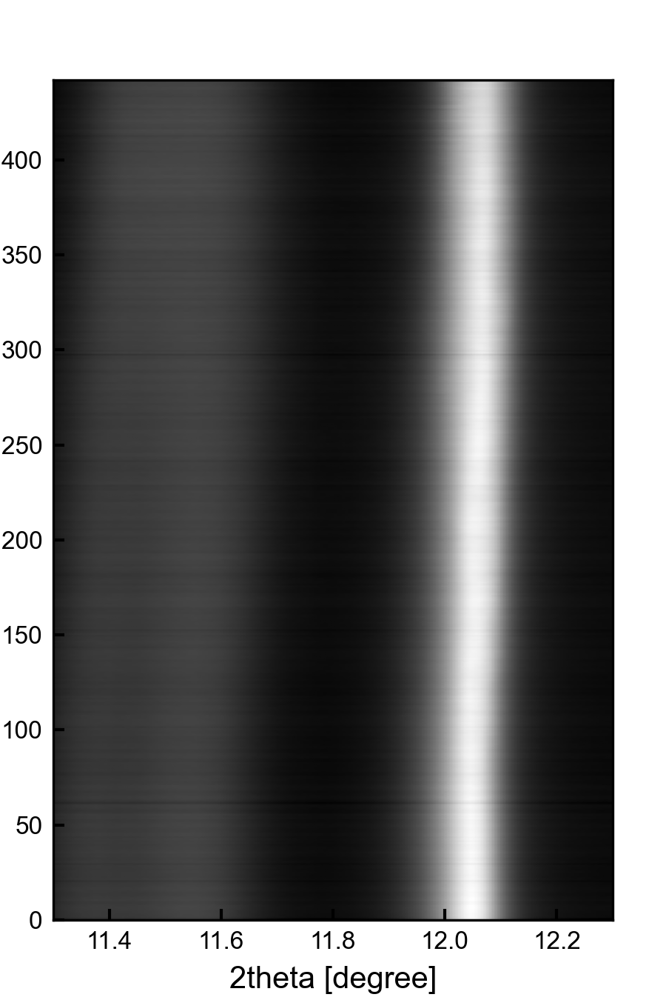

In [32]:
def imshow_profile():

    # log形式?
    # flag_log = True

    # x軸の範囲
    theta_range = (11.3,12.3)

    # figureのサイズ
    size_inches = (3, 4.5)

    if True: # Main

        # flag処理
        if True:
            # flag_log
            try:
                flag_log # type: ignore
            except NameError:
                flag_log = False

        # figureを作成
        fig, ax = plt.subplots()
        fig.set_size_inches(size_inches)
        fig.set_dpi(300)
        fig.subplots_adjust(
            left = 0.08,
            right = 0.92,
            bottom = 0.08,
            top = 0.92
        )

        # xデータを読み込み（共通）
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # axを構成
        ax.set_xlabel("2theta [degree]", fontsize = 10)
        try:
            theta_range # type: ignore
        except:
            theta_range = (theta[0], theta[-1])
        ax.set_xlim(*theta_range) # type: ignore
        
        # 強度データを取得
        n_frame = len(data["set_filelist"]["flist"])
        intensities = list()
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensities.append(np.array(f["intensity"]["frame = {}".format(i)][()])) # type: ignore
        intensities = np.vstack(intensities)

        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta<theta_range[0]] = False # type: ignore
        mask[theta>theta_range[1]] = False # type: ignore

        # imshow
        if flag_log:
            ax.imshow(
                np.log(intensities),
                aspect = "auto",
                extent = (theta[0], theta[-1], 0, n_frame), # type: ignore
                cmap = "grey",
                origin = "lower",
                vmax = np.max(intensities.T[mask].T),
                vmin = np.min(intensities.T[mask].T),
            )
        else:
            ax.imshow(
                intensities,
                aspect = "auto",
                extent = (theta[0], theta[-1], 0, n_frame), # type: ignore
                cmap = "grey",
                origin = "lower",
                vmax = np.max(intensities.T[mask].T),
                vmin = np.min(intensities.T[mask].T),
            )

        # 画像の表示
        fig.canvas.draw()
        img = im.frombuffer(
            mode = "RGBA",
            size = fig.canvas.get_width_height(),
            data = fig.canvas.buffer_rgba(), # type: ignore
            decoder_name = "raw"
        )
        plt.close()
        key = sys._getframe().f_code.co_name
        imgfilename = cachedir + "/{}.png".format(key)
        img.save(imgfilename)
        logger.debug("[Save fig]: " + os.path.abspath(imgfilename))
        display(Image(filename = imgfilename, width = size_inches[0]*100))

    return
imshow_profile()
del imshow_profile

## 3. フィッティング

In [33]:
from modules.peakfit import peakfit, pseudoVoigt
import matplotlib.animation as anim

### KCl110

フィッティング範囲を絞ります。

Progress: [■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■] 100% (542/542) 


DEBUG      2025-07-15 09:06:39,711 [3263963083.py:80] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\KCl110\set_fitlim.png
DEBUG      2025-07-15 09:06:40,043 [3263963083.py:83] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\KCl110\set_fitlim.pdf


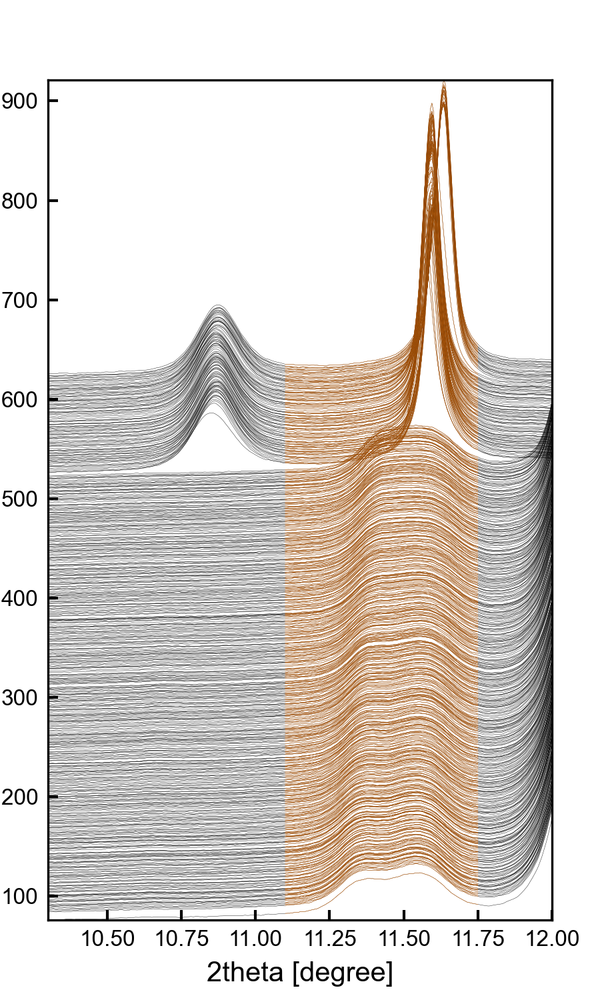

INFO       2025-07-15 09:06:40,063 [3263963083.py:96] [Add variables]: set_fitlim/KCl110



├── set_filelist
│   ├── dir <class 'str'>
│   ├── flist <class 'list'>
│   ├── header <class 'str'>
│   └── footer <class 'str'>
├── convertCSV2HDF
│   └── hdf <class 'str'>
└── set_fitlim
    └── KCl110
        ├── theta_range <class 'tuple'>
        ├── aset <class 'int'>
        ├── size_inches <class 'tuple'>
        ├── fit_range <class 'tuple'>
        └── ylim <class 'tuple'>

In [10]:
def set_fitlim():

    # ピーク名
    peakname = "KCl110"

    # profileの間隔
    aset = 1

    # x軸の範囲
    theta_range = (10.3,12)

    # fittingする範囲
    fit_range = (11.1, 11.75)

    # グラフのサイズ
    size_inches = (3,5)

    if True: # Main

        # figureを作成
        fig, ax = plt.subplots()
        fig.set_size_inches(size_inches)
        fig.set_dpi(300)
        fig.subplots_adjust(
            left = 0.08,
            right = 0.92,
            bottom = 0.08,
            top = 0.92
        )

        # xデータを読み込み（共通）
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta < theta_range[0]] = False
        mask[theta > theta_range[1]] = False
        fitmask = np.ones(theta.shape).astype(np.bool_)
        fitmask[theta < fit_range[0]] = False
        fitmask[theta > fit_range[1]] = False

        # すべてプロットする
        n_frame = len(data["set_filelist"]["flist"])
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensity = np.array(f["intensity"]["frame = {}".format(i)][()]) # type: ignore
                ax.plot(
                    theta[mask],
                    (intensity + i*aset)[mask],
                    lw = 0.1,
                    c = "0"
                )
                ax.plot(
                    theta[fitmask],
                    (intensity + i*aset)[fitmask],
                    lw = 0.1,
                    c = "tab:orange"
                )
                simple_progress_bar(i+1, n_frame)

        # axを構成
        ax.set_xlabel("2theta [degree]", fontsize = 10)
        ax.autoscale(tight = True)
        ax.set_xlim(*theta_range) # type: ignore
        ylim = ax.get_ylim()

        # 画像の表示
        fig.canvas.draw()
        img = im.frombuffer(
            mode = "RGBA",
            size = fig.canvas.get_width_height(),
            data = fig.canvas.buffer_rgba(), # type: ignore
            decoder_name = "raw"
        )
        os.makedirs(cachedir + "/{}".format(peakname), exist_ok=True)
        key = sys._getframe().f_code.co_name
        imgfilename = cachedir + "/{}/{}.png".format(peakname, key)
        img.save(imgfilename)
        logger.debug("[Save fig]: " + os.path.abspath(imgfilename))
        pdffilename = cachedir + "/{}/{}.pdf".format(peakname, key)
        plt.savefig(pdffilename)
        logger.debug("[Save fig]: " + os.path.abspath(pdffilename))
        plt.close()
        display(Image(filename = imgfilename, width = size_inches[0]*100))

        # データ格納
        if not key in data.keys():
            data[key] = dict()
        data[key][peakname] = dict()
        data[key][peakname]["theta_range"] = theta_range
        data[key][peakname]["aset"] = aset
        data[key][peakname]["size_inches"] = size_inches
        data[key][peakname]["fit_range"] = fit_range
        data[key][peakname]["ylim"] = ylim
        logger.info("[Add variables]: {}/{}".format(key, peakname))
        dict_tree(data)

    return
set_fitlim()
del set_fitlim

In [ ]:
def autofit():

    peakname = "KCl110"

    if True: # Main
        # 角度データを読み込み
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # 強度データを取得
        n_frame = len(data["set_filelist"]["flist"])
        intensities = list()
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensities.append(np.array(f["intensity"]["frame = {}".format(i)][()])) # type: ignore
        intensities = np.vstack(intensities)

        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta < data["set_fitlim"][peakname]["fit_range"][0]] = False
        mask[theta > data["set_fitlim"][peakname]["fit_range"][1]] = False
        theta_fit = theta[mask]
        intensities_fit = intensities.T[mask].T

        # 出力格納用変数を定義
        res = [None]*n_frame

        # フィット用関数を定義
        pf = peakfit()
        def process(i):
            _res = pf.fit_Vigot_func(theta = theta_fit, intensity = intensities_fit[i])
            res_dict = dict()
            for j, k in enumerate(["popt", "pcov"]):
                res_dict[k] = dict()
                for l, m in enumerate(pf.variables(nop = 1)):
                    res_dict[k][m] = _res[j][l]
            res_dict["r2"] = _res[2]
            return i, res_dict

        # マルチスレッドを使いながら演算
        with confu.ThreadPoolExecutor() as tpe:
            futures = [tpe.submit(process, i_frame) for i_frame in np.arange(n_frame)]
            for i, future in enumerate(confu.as_completed(futures)):
                i_frame, val = future.result()
                res[i_frame] = val # type: ignore
                simple_progress_bar(i+1, n_frame)
        
        # データ格納
        key = sys._getframe().f_code.co_name
        if not key in data.keys():
            data[key] = dict()
        data[key][peakname] = dict()
        data[key][peakname]["res"] = res
        logger.debug("[Add variable]: " + peakname + "/res")
        logger.info("size of data: {} MB".format(sys.getsizeof(data)%1024%1024))

        # データ保存
        os.makedirs(cachedir + "/" + peakname, exist_ok=True)
        jsonfile = cachedir + "/{}/{}.json".format(peakname, key)
        with open(jsonfile, mode = "w") as f:
            json.dump(res, f, indent = 4)
        logger.info("[Save json]: " + os.path.abspath(jsonfile))
        dict_tree(data)

    return
autofit()
del autofit

フィッティング結果を出力します。

In [ ]:
def plot_res():

    peakname = "KCl110"

    if True: # Main

        # 変数を読み込み
        theta_range = data["set_fitlim"][peakname]["theta_range"]
        fit_range = data["set_fitlim"][peakname]["fit_range"]
        aset = data["set_fitlim"][peakname]["aset"]
        size_inches = data["set_fitlim"][peakname]["size_inches"]
        ylim = data["set_fitlim"][peakname]["ylim"]

        # figureを作成
        fig, ax = plt.subplots()
        fig.set_size_inches(size_inches)
        fig.set_dpi(300)
        fig.subplots_adjust(
            left = 0.08,
            right = 0.92,
            bottom = 0.08,
            top = 0.92
        )

        # xデータを読み込み（共通）
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta < theta_range[0]] = False
        mask[theta > theta_range[1]] = False
        fitmask = np.ones(theta.shape).astype(np.bool_)
        fitmask[theta < fit_range[0]] = False
        fitmask[theta > fit_range[1]] = False

        # すべてプロットする
        n_frame = len(data["set_filelist"]["flist"])
        pf = peakfit()
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensity = np.array(f["intensity"]["frame = {}".format(i)][()]) # type: ignore
                ax.plot(
                    theta[mask],
                    (intensity + i*aset)[mask],
                    lw = 0.1,
                    c = "0"
                )
                x = np.linspace(theta[fitmask][0], theta[fitmask][-1], 200)
                y: np.ndarray = pseudoVoigt(
                    x,
                    *[data["autofit"][peakname]["res"][i]["popt"][j] for j in pf.variables()]
                ) # type: ignore
                ax.plot(
                    x,
                    y + i*aset,
                    lw = 0.1,
                    c = "tab:orange"
                )
                ax.plot(
                    [data["autofit"][peakname]["res"][i]["popt"]["mu"]],
                    [
                        data["autofit"][peakname]["res"][i]["popt"]["amp"]
                        + data["autofit"][peakname]["res"][i]["popt"]["b0"]
                        + data["autofit"][peakname]["res"][i]["popt"]["b1"] * data["autofit"][peakname]["res"][i]["popt"]["mu"]
                        + i*aset
                    ],
                    lw = 0,
                    marker = "o",
                    ms = 1,
                    mec = "tab:orange",
                    c = "1",
                    mew = 0.1
                )
                simple_progress_bar(i+1, n_frame)

        # axを構成
        ax.set_xlabel("2theta [degree]", fontsize = 10)
        ax.autoscale(tight = True)
        ax.set_xlim(*theta_range) # type: ignore
        ax.set_ylim(ylim)

        # 画像の表示
        fig.canvas.draw()
        img = im.frombuffer(
            mode = "RGBA",
            size = fig.canvas.get_width_height(),
            data = fig.canvas.buffer_rgba(), # type: ignore
            decoder_name = "raw"
        )
        os.makedirs(cachedir + "/" + peakname, exist_ok=True)
        key = sys._getframe().f_code.co_name
        imgfilename = cachedir + "/{}/{}.png".format(peakname, key)
        img.save(imgfilename)
        logger.debug("[Save fig]: " + os.path.abspath(imgfilename))
        pdffilename = cachedir + "/{}/{}.pdf".format(peakname, key)
        plt.savefig(pdffilename)
        logger.debug("[Save fig]: " + os.path.abspath(pdffilename))
        plt.close()
        display(Image(filename = imgfilename, width = size_inches[0]*100))

    return
plot_res()
del plot_res

### FeH111

フィッティング範囲を絞ります。

Progress: [■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■] 100% (442/442) 


DEBUG      2025-07-15 09:22:39,079 [1172848656.py:81] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\FeH111\set_fitlim.png
DEBUG      2025-07-15 09:22:39,371 [1172848656.py:84] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\FeH111\set_fitlim.pdf


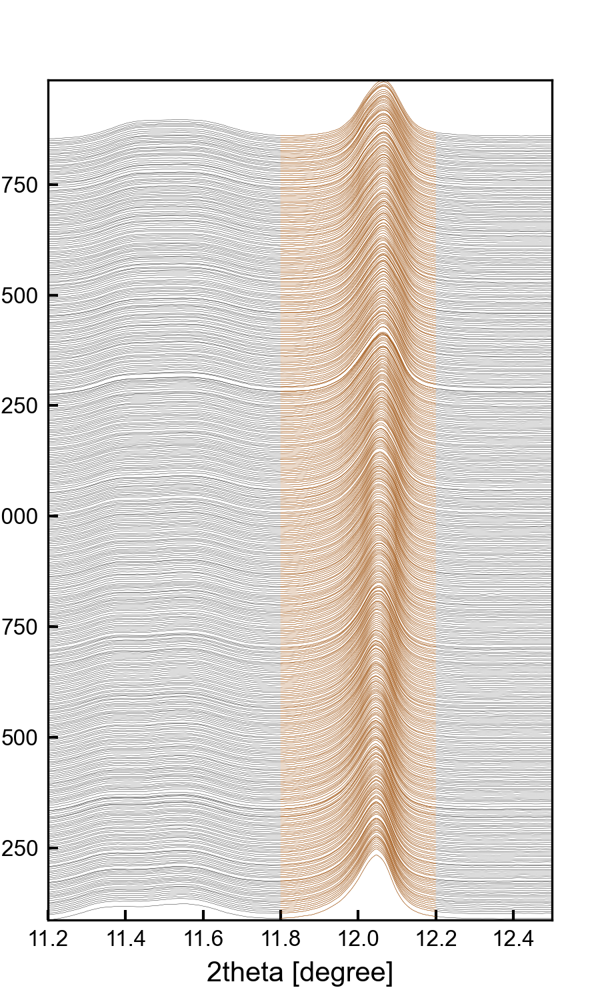

INFO       2025-07-15 09:22:39,387 [1172848656.py:97] [Add variables]: set_fitlim/FeH111



├── set_filelist
│   ├── dir <class 'str'>
│   ├── flist <class 'list'>
│   ├── header <class 'str'>
│   └── footer <class 'str'>
├── convertCSV2HDF
│   └── hdf <class 'str'>
└── set_fitlim
    ├── KCl110
    │   ├── theta_range <class 'tuple'>
    │   ├── aset <class 'int'>
    │   ├── size_inches <class 'tuple'>
    │   ├── fit_range <class 'tuple'>
    │   └── ylim <class 'tuple'>
    └── FeH111
        ├── theta_range <class 'tuple'>
        ├── aset <class 'int'>
        ├── size_inches <class 'tuple'>
        ├── fit_range <class 'tuple'>
        └── ylim <class 'tuple'>

In [36]:
def set_fitlim():

    # ピーク名
    peakname = "FeH111"

    # profileの間隔
    aset = 4

    # x軸の範囲
    theta_range = (11.2, 12.5)

    # fittingする範囲
    fit_range = (11.8, 12.2)

    # グラフのサイズ
    size_inches = (3,5)

    if True: # Main

        # figureを作成
        fig, ax = plt.subplots()
        fig.set_size_inches(size_inches)
        fig.set_dpi(300)
        fig.subplots_adjust(
            left = 0.08,
            right = 0.92,
            bottom = 0.08,
            top = 0.92
        )

        # xデータを読み込み（共通）
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta < theta_range[0]] = False
        mask[theta > theta_range[1]] = False
        fitmask = np.ones(theta.shape).astype(np.bool_)
        fitmask[theta < fit_range[0]] = False
        fitmask[theta > fit_range[1]] = False

        # すべてプロットする
        n_frame = len(data["set_filelist"]["flist"])
        n_frame = 442
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensity = np.array(f["intensity"]["frame = {}".format(i)][()]) # type: ignore
                ax.plot(
                    theta[mask],
                    (intensity + i*aset)[mask],
                    lw = 0.1,
                    c = "0"
                )
                ax.plot(
                    theta[fitmask],
                    (intensity + i*aset)[fitmask],
                    lw = 0.1,
                    c = "tab:orange"
                )
                simple_progress_bar(i+1, n_frame)

        # axを構成
        ax.set_xlabel("2theta [degree]", fontsize = 10)
        ax.autoscale(tight = True)
        ax.set_xlim(*theta_range) # type: ignore
        ylim = ax.get_ylim()

        # 画像の表示
        fig.canvas.draw()
        img = im.frombuffer(
            mode = "RGBA",
            size = fig.canvas.get_width_height(),
            data = fig.canvas.buffer_rgba(), # type: ignore
            decoder_name = "raw"
        )
        os.makedirs(cachedir + "/{}".format(peakname), exist_ok=True)
        key = sys._getframe().f_code.co_name
        imgfilename = cachedir + "/{}/{}.png".format(peakname, key)
        img.save(imgfilename)
        logger.debug("[Save fig]: " + os.path.abspath(imgfilename))
        pdffilename = cachedir + "/{}/{}.pdf".format(peakname, key)
        plt.savefig(pdffilename)
        logger.debug("[Save fig]: " + os.path.abspath(pdffilename))
        plt.close()
        display(Image(filename = imgfilename, width = size_inches[0]*100))

        # データ格納
        if not key in data.keys():
            data[key] = dict()
        data[key][peakname] = dict()
        data[key][peakname]["theta_range"] = theta_range
        data[key][peakname]["aset"] = aset
        data[key][peakname]["size_inches"] = size_inches
        data[key][peakname]["fit_range"] = fit_range
        data[key][peakname]["ylim"] = ylim
        logger.info("[Add variables]: {}/{}".format(key, peakname))
        dict_tree(data)

    return
set_fitlim()
del set_fitlim

In [37]:
def autofit():

    peakname = "FeH111"

    if True: # Main
        # 角度データを読み込み
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # 強度データを取得
        n_frame = len(data["set_filelist"]["flist"])
        intensities = list()
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensities.append(np.array(f["intensity"]["frame = {}".format(i)][()])) # type: ignore
        intensities = np.vstack(intensities)

        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta < data["set_fitlim"][peakname]["fit_range"][0]] = False
        mask[theta > data["set_fitlim"][peakname]["fit_range"][1]] = False
        theta_fit = theta[mask]
        intensities_fit = intensities.T[mask].T

        # 出力格納用変数を定義
        res = [None]*n_frame

        # フィット用関数を定義
        pf = peakfit()
        def process(i):
            initparam = pf.calc_init(
                theta = theta_fit,
                intensity = intensities_fit[i]
            )
            initparam[1] = 11.7
            _res = pf.fit_Vigot_func(
                theta = theta_fit,
                intensity = intensities_fit[i],
                initparams = initparam
            )
            res_dict = dict()
            for j, k in enumerate(["popt", "pcov"]):
                res_dict[k] = dict()
                for l, m in enumerate(pf.variables(nop = 1)):
                    res_dict[k][m] = _res[j][l]
            res_dict["r2"] = _res[2]
            return i, res_dict

        # マルチスレッドを使いながら演算
        with confu.ThreadPoolExecutor() as tpe:
            futures = [tpe.submit(process, i_frame) for i_frame in np.arange(n_frame)]
            for i, future in enumerate(confu.as_completed(futures)):
                i_frame, val = future.result()
                res[i_frame] = val # type: ignore
                simple_progress_bar(i+1, n_frame)
        
        # データ格納
        key = sys._getframe().f_code.co_name
        if not key in data.keys():
            data[key] = dict()
        data[key][peakname] = dict()
        data[key][peakname]["res"] = res
        logger.debug("[Add variable]: " + peakname + "/res")
        logger.info("size of data: {} MB".format(sys.getsizeof(data)%1024%1024))

        # データ保存
        os.makedirs(cachedir + "/" + peakname, exist_ok=True)
        jsonfile = cachedir + "/{}/{}.json".format(peakname, key)
        with open(jsonfile, mode = "w") as f:
            json.dump(res, f, indent = 4)
        logger.info("[Save json]: " + os.path.abspath(jsonfile))
        dict_tree(data)

    return
autofit()
del autofit

Progress: [■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■-]  99% (438/442) 

DEBUG      2025-07-15 09:22:49,193 [2169881763.py:63] [Add variable]: FeH111/res
INFO       2025-07-15 09:22:49,194 [2169881763.py:64] size of data: 184 MB
INFO       2025-07-15 09:22:49,204 [2169881763.py:71] [Save json]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\FeH111\autofit.json


Progress: [■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■] 100% (442/442) 

├── set_filelist
│   ├── dir <class 'str'>
│   ├── flist <class 'list'>
│   ├── header <class 'str'>
│   └── footer <class 'str'>
├── convertCSV2HDF
│   └── hdf <class 'str'>
├── set_fitlim
│   ├── KCl110
│   │   ├── theta_range <class 'tuple'>
│   │   ├── aset <class 'int'>
│   │   ├── size_inches <class 'tuple'>
│   │   ├── fit_range <class 'tuple'>
│   │   └── ylim <class 'tuple'>
│   └── FeH111
│       ├── theta_range <class 'tuple'>
│       ├── aset <class 'int'>
│       ├── size_inches <class 'tuple'>
│       ├── fit_range <class 'tuple'>
│       └── ylim <class 'tuple'>
└── autofit
    └── FeH111
        └── res <class 'list'>

フィッティング結果を出力します。

Progress: [■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■] 100% (442/442) 


DEBUG      2025-07-15 09:22:51,791 [3622972237.py:95] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\FeH111\plot_res.png
DEBUG      2025-07-15 09:22:52,248 [3622972237.py:98] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\FeH111\plot_res.pdf


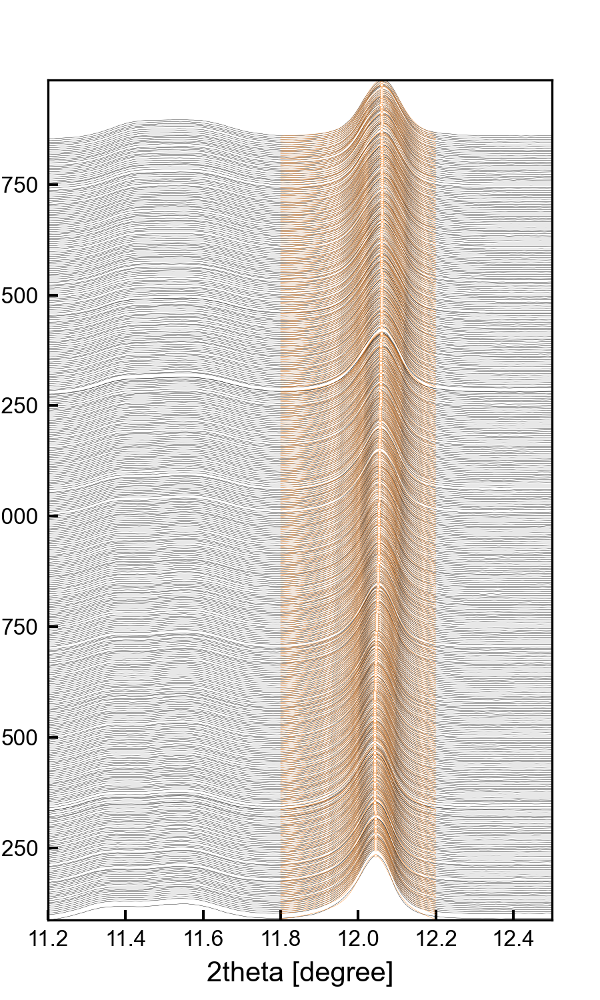

In [38]:
def plot_res():

    peakname = "FeH111"

    if True: # Main

        # 変数を読み込み
        theta_range = data["set_fitlim"][peakname]["theta_range"]
        fit_range = data["set_fitlim"][peakname]["fit_range"]
        aset = data["set_fitlim"][peakname]["aset"]
        size_inches = data["set_fitlim"][peakname]["size_inches"]
        ylim = data["set_fitlim"][peakname]["ylim"]

        # figureを作成
        fig, ax = plt.subplots()
        fig.set_size_inches(size_inches)
        fig.set_dpi(300)
        fig.subplots_adjust(
            left = 0.08,
            right = 0.92,
            bottom = 0.08,
            top = 0.92
        )

        # xデータを読み込み（共通）
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta < theta_range[0]] = False
        mask[theta > theta_range[1]] = False
        fitmask = np.ones(theta.shape).astype(np.bool_)
        fitmask[theta < fit_range[0]] = False
        fitmask[theta > fit_range[1]] = False

        # すべてプロットする
        n_frame = len(data["set_filelist"]["flist"])
        pf = peakfit()
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensity = np.array(f["intensity"]["frame = {}".format(i)][()]) # type: ignore
                ax.plot(
                    theta[mask],
                    (intensity + i*aset)[mask],
                    lw = 0.1,
                    c = "0"
                )
                x = np.linspace(theta[fitmask][0], theta[fitmask][-1], 200)
                y: np.ndarray = pseudoVoigt(
                    x,
                    *[data["autofit"][peakname]["res"][i]["popt"][j] for j in pf.variables()]
                ) # type: ignore
                ax.plot(
                    x,
                    y + i*aset,
                    lw = 0.1,
                    c = "tab:orange"
                )
                ax.plot(
                    [data["autofit"][peakname]["res"][i]["popt"]["mu"]],
                    [
                        data["autofit"][peakname]["res"][i]["popt"]["amp"]
                        + data["autofit"][peakname]["res"][i]["popt"]["b0"]
                        + data["autofit"][peakname]["res"][i]["popt"]["b1"] * data["autofit"][peakname]["res"][i]["popt"]["mu"]
                        + i*aset
                    ],
                    lw = 0,
                    marker = "o",
                    ms = 1,
                    mec = "tab:orange",
                    c = "1",
                    mew = 0.1
                )
                simple_progress_bar(i+1, n_frame)

        # axを構成
        ax.set_xlabel("2theta [degree]", fontsize = 10)
        ax.autoscale(tight = True)
        ax.set_xlim(*theta_range) # type: ignore
        ax.set_ylim(ylim)

        # 画像の表示
        fig.canvas.draw()
        img = im.frombuffer(
            mode = "RGBA",
            size = fig.canvas.get_width_height(),
            data = fig.canvas.buffer_rgba(), # type: ignore
            decoder_name = "raw"
        )
        os.makedirs(cachedir + "/" + peakname, exist_ok=True)
        key = sys._getframe().f_code.co_name
        imgfilename = cachedir + "/{}/{}.png".format(peakname, key)
        img.save(imgfilename)
        logger.debug("[Save fig]: " + os.path.abspath(imgfilename))
        pdffilename = cachedir + "/{}/{}.pdf".format(peakname, key)
        plt.savefig(pdffilename)
        logger.debug("[Save fig]: " + os.path.abspath(pdffilename))
        plt.close()
        display(Image(filename = imgfilename, width = size_inches[0]*100))

    return
plot_res()
del plot_res

### FeH200

フィッティング範囲を絞ります。

Progress: [■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■] 100% (442/442) 


DEBUG      2025-07-15 10:54:21,737 [2156985846.py:80] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\FeH200\set_fitlim.png
DEBUG      2025-07-15 10:54:22,028 [2156985846.py:83] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\FeH200\set_fitlim.pdf


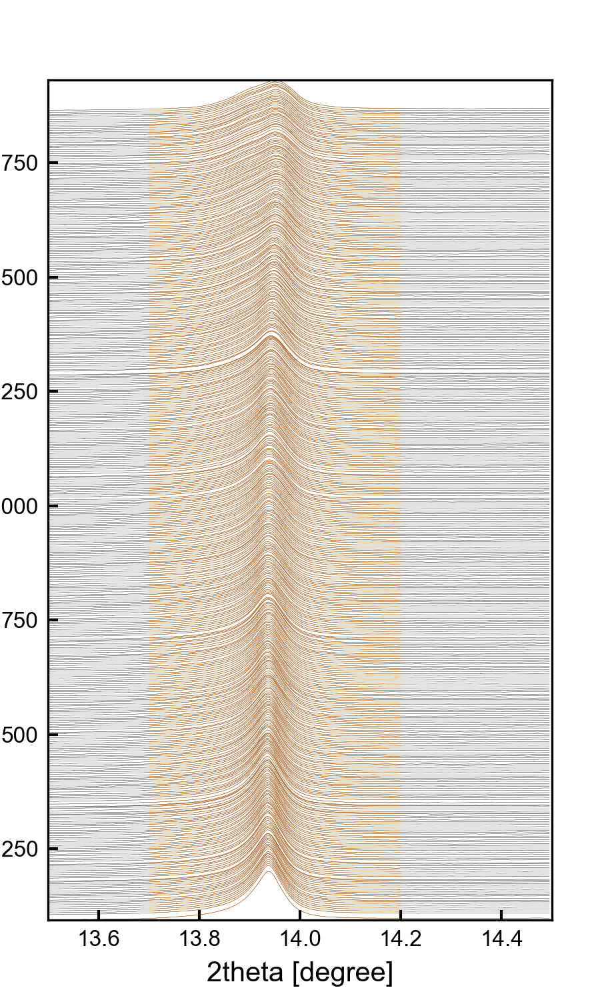

INFO       2025-07-15 10:54:22,043 [2156985846.py:96] [Add variables]: set_fitlim/FeH200



├── set_filelist
│   ├── dir <class 'str'>
│   ├── flist <class 'list'>
│   ├── header <class 'str'>
│   └── footer <class 'str'>
├── convertCSV2HDF
│   └── hdf <class 'str'>
├── set_fitlim
│   ├── KCl110
│   │   ├── theta_range <class 'tuple'>
│   │   ├── aset <class 'int'>
│   │   ├── size_inches <class 'tuple'>
│   │   ├── fit_range <class 'tuple'>
│   │   └── ylim <class 'tuple'>
│   ├── FeH111
│   │   ├── theta_range <class 'tuple'>
│   │   ├── aset <class 'int'>
│   │   ├── size_inches <class 'tuple'>
│   │   ├── fit_range <class 'tuple'>
│   │   └── ylim <class 'tuple'>
│   └── FeH200
│       ├── theta_range <class 'tuple'>
│       ├── aset <class 'int'>
│       ├── size_inches <class 'tuple'>
│       ├── fit_range <class 'tuple'>
│       └── ylim <class 'tuple'>
└── autofit
    ├── FeH111
    │   └── res <class 'list'>
    └── FeH200
        └── res <class 'list'>

In [45]:
def set_fitlim():

    # ピーク名
    peakname = "FeH200"

    # profileの間隔
    aset = 4

    # x軸の範囲
    theta_range = (13.5,14.5)

    # fittingする範囲
    fit_range = (13.7,14.2)

    # グラフのサイズ
    size_inches = (3,5)

    if True: # Main

        # figureを作成
        fig, ax = plt.subplots()
        fig.set_size_inches(size_inches)
        fig.set_dpi(300)
        fig.subplots_adjust(
            left = 0.08,
            right = 0.92,
            bottom = 0.08,
            top = 0.92
        )

        # xデータを読み込み（共通）
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta < theta_range[0]] = False
        mask[theta > theta_range[1]] = False
        fitmask = np.ones(theta.shape).astype(np.bool_)
        fitmask[theta < fit_range[0]] = False
        fitmask[theta > fit_range[1]] = False

        # すべてプロットする
        n_frame = len(data["set_filelist"]["flist"])
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensity = np.array(f["intensity"]["frame = {}".format(i)][()]) # type: ignore
                ax.plot(
                    theta[mask],
                    (intensity + i*aset)[mask],
                    lw = 0.1,
                    c = "0"
                )
                ax.plot(
                    theta[fitmask],
                    (intensity + i*aset)[fitmask],
                    lw = 0.1,
                    c = "tab:orange"
                )
                simple_progress_bar(i+1, n_frame)

        # axを構成
        ax.set_xlabel("2theta [degree]", fontsize = 10)
        ax.autoscale(tight = True)
        ax.set_xlim(*theta_range) # type: ignore
        ylim = ax.get_ylim()

        # 画像の表示
        fig.canvas.draw()
        img = im.frombuffer(
            mode = "RGBA",
            size = fig.canvas.get_width_height(),
            data = fig.canvas.buffer_rgba(), # type: ignore
            decoder_name = "raw"
        )
        os.makedirs(cachedir + "/{}".format(peakname), exist_ok=True)
        key = sys._getframe().f_code.co_name
        imgfilename = cachedir + "/{}/{}.png".format(peakname, key)
        img.save(imgfilename)
        logger.debug("[Save fig]: " + os.path.abspath(imgfilename))
        pdffilename = cachedir + "/{}/{}.pdf".format(peakname, key)
        plt.savefig(pdffilename)
        logger.debug("[Save fig]: " + os.path.abspath(pdffilename))
        plt.close()
        display(Image(filename = imgfilename, width = size_inches[0]*100))

        # データ格納
        if not key in data.keys():
            data[key] = dict()
        data[key][peakname] = dict()
        data[key][peakname]["theta_range"] = theta_range
        data[key][peakname]["aset"] = aset
        data[key][peakname]["size_inches"] = size_inches
        data[key][peakname]["fit_range"] = fit_range
        data[key][peakname]["ylim"] = ylim
        logger.info("[Add variables]: {}/{}".format(key, peakname))
        dict_tree(data)

    return
set_fitlim()
del set_fitlim

In [46]:
def autofit():

    peakname = "FeH200"

    if True: # Main
        # 角度データを読み込み
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # 強度データを取得
        n_frame = len(data["set_filelist"]["flist"])
        intensities = list()
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensities.append(np.array(f["intensity"]["frame = {}".format(i)][()])) # type: ignore
        intensities = np.vstack(intensities)

        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta < data["set_fitlim"][peakname]["fit_range"][0]] = False
        mask[theta > data["set_fitlim"][peakname]["fit_range"][1]] = False
        theta_fit = theta[mask]
        intensities_fit = intensities.T[mask].T

        # 出力格納用変数を定義
        res = [None]*n_frame

        # フィット用関数を定義
        pf = peakfit()
        def process(i):
            _res = pf.fit_Vigot_func(theta = theta_fit, intensity = intensities_fit[i])
            res_dict = dict()
            for j, k in enumerate(["popt", "pcov"]):
                res_dict[k] = dict()
                for l, m in enumerate(pf.variables(nop = 1)):
                    res_dict[k][m] = _res[j][l]
            res_dict["r2"] = _res[2]
            return i, res_dict

        # マルチスレッドを使いながら演算
        with confu.ThreadPoolExecutor() as tpe:
            futures = [tpe.submit(process, i_frame) for i_frame in np.arange(n_frame)]
            for i, future in enumerate(confu.as_completed(futures)):
                i_frame, val = future.result()
                res[i_frame] = val # type: ignore
                simple_progress_bar(i+1, n_frame)
        
        # データ格納
        key = sys._getframe().f_code.co_name
        if not key in data.keys():
            data[key] = dict()
        data[key][peakname] = dict()
        data[key][peakname]["res"] = res
        logger.debug("[Add variable]: " + peakname + "/res")
        logger.info("size of data: {} MB".format(sys.getsizeof(data)%1024%1024))

        # データ保存
        os.makedirs(cachedir + "/" + peakname, exist_ok=True)
        jsonfile = cachedir + "/{}/{}.json".format(peakname, key)
        with open(jsonfile, mode = "w") as f:
            json.dump(res, f, indent = 4)
        logger.info("[Save json]: " + os.path.abspath(jsonfile))
        dict_tree(data)

    return
autofit()
del autofit

Progress: [■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■-] 100% (440/442) 

DEBUG      2025-07-15 10:54:30,345 [3364431801.py:54] [Add variable]: FeH200/res
INFO       2025-07-15 10:54:30,345 [3364431801.py:55] size of data: 184 MB
INFO       2025-07-15 10:54:30,356 [3364431801.py:62] [Save json]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\FeH200\autofit.json


Progress: [■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■] 100% (442/442) 

├── set_filelist
│   ├── dir <class 'str'>
│   ├── flist <class 'list'>
│   ├── header <class 'str'>
│   └── footer <class 'str'>
├── convertCSV2HDF
│   └── hdf <class 'str'>
├── set_fitlim
│   ├── KCl110
│   │   ├── theta_range <class 'tuple'>
│   │   ├── aset <class 'int'>
│   │   ├── size_inches <class 'tuple'>
│   │   ├── fit_range <class 'tuple'>
│   │   └── ylim <class 'tuple'>
│   ├── FeH111
│   │   ├── theta_range <class 'tuple'>
│   │   ├── aset <class 'int'>
│   │   ├── size_inches <class 'tuple'>
│   │   ├── fit_range <class 'tuple'>
│   │   └── ylim <class 'tuple'>
│   └── FeH200
│       ├── theta_range <class 'tuple'>
│       ├── aset <class 'int'>
│       ├── size_inches <class 'tuple'>
│       ├── fit_range <class 'tuple'>
│       └── ylim <class 'tuple'>
└── autofit
    ├── FeH111
    │   └── res <class 'list'>
    └── FeH200
        └── res <class 'list'>

フィッティング結果を出力します。

Progress: [■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■■] 100% (442/442) 


DEBUG      2025-07-15 10:54:33,151 [2259055432.py:95] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\FeH200\plot_res.png
DEBUG      2025-07-15 10:54:33,662 [2259055432.py:98] [Save fig]: c:\Users\okaza\pythonenv\fpd\fitting_csv\.cache\FeH200\plot_res.pdf


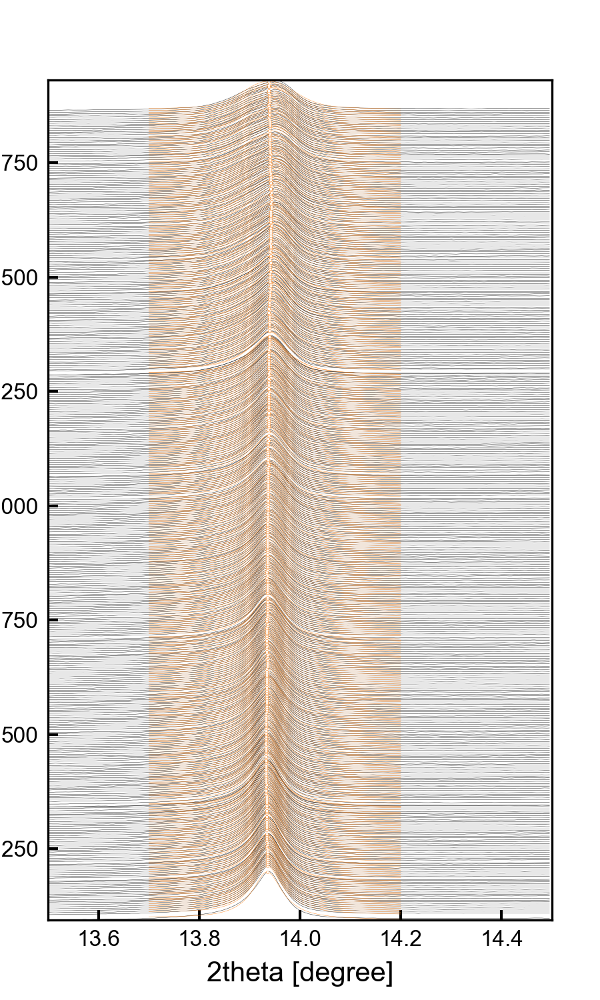

In [47]:
def plot_res():

    peakname = "FeH200"

    if True: # Main

        # 変数を読み込み
        theta_range = data["set_fitlim"][peakname]["theta_range"]
        fit_range = data["set_fitlim"][peakname]["fit_range"]
        aset = data["set_fitlim"][peakname]["aset"]
        size_inches = data["set_fitlim"][peakname]["size_inches"]
        ylim = data["set_fitlim"][peakname]["ylim"]

        # figureを作成
        fig, ax = plt.subplots()
        fig.set_size_inches(size_inches)
        fig.set_dpi(300)
        fig.subplots_adjust(
            left = 0.08,
            right = 0.92,
            bottom = 0.08,
            top = 0.92
        )

        # xデータを読み込み（共通）
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta < theta_range[0]] = False
        mask[theta > theta_range[1]] = False
        fitmask = np.ones(theta.shape).astype(np.bool_)
        fitmask[theta < fit_range[0]] = False
        fitmask[theta > fit_range[1]] = False

        # すべてプロットする
        n_frame = len(data["set_filelist"]["flist"])
        pf = peakfit()
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensity = np.array(f["intensity"]["frame = {}".format(i)][()]) # type: ignore
                ax.plot(
                    theta[mask],
                    (intensity + i*aset)[mask],
                    lw = 0.1,
                    c = "0"
                )
                x = np.linspace(theta[fitmask][0], theta[fitmask][-1], 200)
                y: np.ndarray = pseudoVoigt(
                    x,
                    *[data["autofit"][peakname]["res"][i]["popt"][j] for j in pf.variables()]
                ) # type: ignore
                ax.plot(
                    x,
                    y + i*aset,
                    lw = 0.1,
                    c = "tab:orange"
                )
                ax.plot(
                    [data["autofit"][peakname]["res"][i]["popt"]["mu"]],
                    [
                        data["autofit"][peakname]["res"][i]["popt"]["amp"]
                        + data["autofit"][peakname]["res"][i]["popt"]["b0"]
                        + data["autofit"][peakname]["res"][i]["popt"]["b1"] * data["autofit"][peakname]["res"][i]["popt"]["mu"]
                        + i*aset
                    ],
                    lw = 0,
                    marker = "o",
                    ms = 1,
                    mec = "tab:orange",
                    c = "1",
                    mew = 0.1
                )
                simple_progress_bar(i+1, n_frame)

        # axを構成
        ax.set_xlabel("2theta [degree]", fontsize = 10)
        ax.autoscale(tight = True)
        ax.set_xlim(*theta_range) # type: ignore
        ax.set_ylim(ylim)

        # 画像の表示
        fig.canvas.draw()
        img = im.frombuffer(
            mode = "RGBA",
            size = fig.canvas.get_width_height(),
            data = fig.canvas.buffer_rgba(), # type: ignore
            decoder_name = "raw"
        )
        os.makedirs(cachedir + "/" + peakname, exist_ok=True)
        key = sys._getframe().f_code.co_name
        imgfilename = cachedir + "/{}/{}.png".format(peakname, key)
        img.save(imgfilename)
        logger.debug("[Save fig]: " + os.path.abspath(imgfilename))
        pdffilename = cachedir + "/{}/{}.pdf".format(peakname, key)
        plt.savefig(pdffilename)
        logger.debug("[Save fig]: " + os.path.abspath(pdffilename))
        plt.close()
        display(Image(filename = imgfilename, width = size_inches[0]*100))

    return
plot_res()
del plot_res

### KCl200

フィッティング範囲を絞ります。

In [ ]:
def set_fitlim():

    # ピーク名
    peakname = "KCl200"

    # profileの間隔
    aset = 0.2

    # x軸の範囲
    theta_range = (14,17)

    # fittingする範囲
    fit_range = (14.5,16)

    # グラフのサイズ
    size_inches = (3,5)

    if True: # Main

        # figureを作成
        fig, ax = plt.subplots()
        fig.set_size_inches(size_inches)
        fig.set_dpi(300)
        fig.subplots_adjust(
            left = 0.08,
            right = 0.92,
            bottom = 0.08,
            top = 0.92
        )

        # xデータを読み込み（共通）
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta < theta_range[0]] = False
        mask[theta > theta_range[1]] = False
        fitmask = np.ones(theta.shape).astype(np.bool_)
        fitmask[theta < fit_range[0]] = False
        fitmask[theta > fit_range[1]] = False

        # すべてプロットする
        n_frame = len(data["set_filelist"]["flist"])
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensity = np.array(f["intensity"]["frame = {}".format(i)][()]) # type: ignore
                ax.plot(
                    theta[mask],
                    (intensity + i*aset)[mask],
                    lw = 0.1,
                    c = "0"
                )
                ax.plot(
                    theta[fitmask],
                    (intensity + i*aset)[fitmask],
                    lw = 0.1,
                    c = "tab:orange"
                )
                simple_progress_bar(i+1, n_frame)

        # axを構成
        ax.set_xlabel("2theta [degree]", fontsize = 10)
        ax.autoscale(tight = True)
        ax.set_xlim(*theta_range) # type: ignore
        ylim = ax.get_ylim()

        # 画像の表示
        fig.canvas.draw()
        img = im.frombuffer(
            mode = "RGBA",
            size = fig.canvas.get_width_height(),
            data = fig.canvas.buffer_rgba(), # type: ignore
            decoder_name = "raw"
        )
        os.makedirs(cachedir + "/{}".format(peakname), exist_ok=True)
        key = sys._getframe().f_code.co_name
        imgfilename = cachedir + "/{}/{}.png".format(peakname, key)
        img.save(imgfilename)
        logger.debug("[Save fig]: " + os.path.abspath(imgfilename))
        pdffilename = cachedir + "/{}/{}.pdf".format(peakname, key)
        plt.savefig(pdffilename)
        logger.debug("[Save fig]: " + os.path.abspath(pdffilename))
        plt.close()
        display(Image(filename = imgfilename, width = size_inches[0]*100))

        # データ格納
        if not key in data.keys():
            data[key] = dict()
        data[key][peakname] = dict()
        data[key][peakname]["theta_range"] = theta_range
        data[key][peakname]["aset"] = aset
        data[key][peakname]["size_inches"] = size_inches
        data[key][peakname]["fit_range"] = fit_range
        data[key][peakname]["ylim"] = ylim
        logger.info("[Add variables]: {}/{}".format(key, peakname))
        dict_tree(data)

    return
set_fitlim()
del set_fitlim

In [ ]:
def autofit():

    peakname = "KCl200"

    if True: # Main
        # 角度データを読み込み
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # 強度データを取得
        n_frame = len(data["set_filelist"]["flist"])
        intensities = list()
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensities.append(np.array(f["intensity"]["frame = {}".format(i)][()])) # type: ignore
        intensities = np.vstack(intensities)

        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta < data["set_fitlim"][peakname]["fit_range"][0]] = False
        mask[theta > data["set_fitlim"][peakname]["fit_range"][1]] = False
        theta_fit = theta[mask]
        intensities_fit = intensities.T[mask].T

        # 出力格納用変数を定義
        res = [None]*n_frame

        # フィット用関数を定義
        pf = peakfit()
        def process(i):
            _res = pf.fit_Vigot_func(theta = theta_fit, intensity = intensities_fit[i])
            res_dict = dict()
            for j, k in enumerate(["popt", "pcov"]):
                res_dict[k] = dict()
                for l, m in enumerate(pf.variables(nop = 1)):
                    res_dict[k][m] = _res[j][l]
            res_dict["r2"] = _res[2]
            return i, res_dict

        # マルチスレッドを使いながら演算
        with confu.ThreadPoolExecutor() as tpe:
            futures = [tpe.submit(process, i_frame) for i_frame in np.arange(n_frame)]
            for i, future in enumerate(confu.as_completed(futures)):
                i_frame, val = future.result()
                res[i_frame] = val # type: ignore
                simple_progress_bar(i+1, n_frame)
        
        # データ格納
        key = sys._getframe().f_code.co_name
        if not key in data.keys():
            data[key] = dict()
        data[key][peakname] = dict()
        data[key][peakname]["res"] = res
        logger.debug("[Add variable]: " + peakname + "/res")
        logger.info("size of data: {} MB".format(sys.getsizeof(data)%1024%1024))

        # データ保存
        os.makedirs(cachedir + "/" + peakname, exist_ok=True)
        jsonfile = cachedir + "/{}/{}.json".format(peakname, key)
        with open(jsonfile, mode = "w") as f:
            json.dump(res, f, indent = 4)
        logger.info("[Save json]: " + os.path.abspath(jsonfile))
        dict_tree(data)

    return
autofit()
del autofit

フィッティング結果を出力します。

In [ ]:
def plot_res():

    peakname = "KCl200"

    if True: # Main

        # 変数を読み込み
        theta_range = data["set_fitlim"][peakname]["theta_range"]
        fit_range = data["set_fitlim"][peakname]["fit_range"]
        aset = data["set_fitlim"][peakname]["aset"]
        size_inches = data["set_fitlim"][peakname]["size_inches"]
        ylim = data["set_fitlim"][peakname]["ylim"]

        # figureを作成
        fig, ax = plt.subplots()
        fig.set_size_inches(size_inches)
        fig.set_dpi(300)
        fig.subplots_adjust(
            left = 0.08,
            right = 0.92,
            bottom = 0.08,
            top = 0.92
        )

        # xデータを読み込み（共通）
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            theta = np.array(f["2theta"][()]) # type: ignore
        
        # mask処理
        mask = np.ones(theta.shape).astype(np.bool_)
        mask[theta < theta_range[0]] = False
        mask[theta > theta_range[1]] = False
        fitmask = np.ones(theta.shape).astype(np.bool_)
        fitmask[theta < fit_range[0]] = False
        fitmask[theta > fit_range[1]] = False

        # すべてプロットする
        n_frame = len(data["set_filelist"]["flist"])
        pf = peakfit()
        with h5py.File(data["convertCSV2HDF"]["hdf"], mode = "r") as f:
            for i in range(n_frame):
                intensity = np.array(f["intensity"]["frame = {}".format(i)][()]) # type: ignore
                ax.plot(
                    theta[mask],
                    (intensity + i*aset)[mask],
                    lw = 0.1,
                    c = "0"
                )
                x = np.linspace(theta[fitmask][0], theta[fitmask][-1], 200)
                y: np.ndarray = pseudoVoigt(
                    x,
                    *[data["autofit"][peakname]["res"][i]["popt"][j] for j in pf.variables()]
                ) # type: ignore
                ax.plot(
                    x,
                    y + i*aset,
                    lw = 0.1,
                    c = "tab:orange"
                )
                ax.plot(
                    [data["autofit"][peakname]["res"][i]["popt"]["mu"]],
                    [
                        data["autofit"][peakname]["res"][i]["popt"]["amp"]
                        + data["autofit"][peakname]["res"][i]["popt"]["b0"]
                        + data["autofit"][peakname]["res"][i]["popt"]["b1"] * data["autofit"][peakname]["res"][i]["popt"]["mu"]
                        + i*aset
                    ],
                    lw = 0,
                    marker = "o",
                    ms = 1,
                    mec = "tab:orange",
                    c = "1",
                    mew = 0.1
                )
                simple_progress_bar(i+1, n_frame)

        # axを構成
        ax.set_xlabel("2theta [degree]", fontsize = 10)
        ax.autoscale(tight = True)
        ax.set_xlim(*theta_range) # type: ignore
        ax.set_ylim(ylim)

        # 画像の表示
        fig.canvas.draw()
        img = im.frombuffer(
            mode = "RGBA",
            size = fig.canvas.get_width_height(),
            data = fig.canvas.buffer_rgba(), # type: ignore
            decoder_name = "raw"
        )
        os.makedirs(cachedir + "/" + peakname, exist_ok=True)
        key = sys._getframe().f_code.co_name
        imgfilename = cachedir + "/{}/{}.png".format(peakname, key)
        img.save(imgfilename)
        logger.debug("[Save fig]: " + os.path.abspath(imgfilename))
        pdffilename = cachedir + "/{}/{}.pdf".format(peakname, key)
        plt.savefig(pdffilename)
        logger.debug("[Save fig]: " + os.path.abspath(pdffilename))
        plt.close()
        display(Image(filename = imgfilename, width = size_inches[0]*100))

    return
plot_res()
del plot_res